<a href="https://colab.research.google.com/github/indu05g7/C-Programming-2021/blob/main/Major_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# **Data Preprocessing**

In [ ]:
import librosa
import os
import json
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


DATASET_PATH = "/content/drive/MyDrive/Train"
JSON_PATH = "data2.json"
SAMPLES_TO_CONSIDER = 16000 # 1 sec. of audio


def preprocess_dataset(dataset_path, json_path, num_mfcc=13, n_fft=2048, hop_length=512):
    """Extracts MFCCs from music dataset and saves them into a json file.
    :param dataset_path (str): Path to dataset
    :param json_path (str): Path to json file used to save MFCCs
    :param num_mfcc (int): Number of coefficients to extract
    :param n_fft (int): Interval we consider to apply FFT. Measured in # of samples
    :param hop_length (int): Sliding window for FFT. Measured in # of samples
    :return:
    """

    # dictionary where we'll store mapping, labels, MFCCs and filenames


    data = {
        "mapping": [],
        "labels": [],
        "MFCCs": [],
        "files": []
    }

    # loop through all sub-dirs
    Total_samples=0
    for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):
        dirnames.sort()
        samples=0
        # ensure we're at sub-folder level
        if dirpath is not dataset_path:

            # save label (i.e., sub-folder name) in the mapping
            label = dirpath.split("/")[-1]
            data["mapping"].append(label)
            print("\nProcessing: '{}'".format(label))

            # process all audio files in sub-dir and store MFCCs
            for f in filenames:
                file_path = os.path.join(dirpath, f)
                Total_samples=Total_samples+1
                samples+=1
                # load audio file and slice it to ensure length consistency among different files
                signal, sample_rate = librosa.load(file_path,sr=22050)


                # drop audio files with less than pre-decided number of samples
                if len(signal) >= SAMPLES_TO_CONSIDER:

                    # ensure consistency of the length of the signal
                    signal = signal[:SAMPLES_TO_CONSIDER]

                    # extract MFCCs
                    #mismatch between the arguments
                   # MFCCs = librosa.feature.mfcc(signal, sample_rate, n_mfcc=num_mfcc, n_fft=n_fft,hop_length=hop_length)
                    MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)


                    # store data for analysed track
                    data["MFCCs"].append(MFCCs.T.tolist())
                    data["labels"].append(i-1)
                    data["files"].append(file_path)
                    print("{}: {}".format(file_path, i-1))
                else:
                    os.remove(file_path)
            print("Processed Samples:",samples)
    print("Total Samples:",Total_samples)

    # save data in json file
    with open(json_path, "w") as fp:
        json.dump(data, fp, indent=4)


if __name__ == "__main__":
    preprocess_dataset(DATASET_PATH, JSON_PATH)


Processing: 'acoff'
/content/drive/MyDrive/Train/acoff/5E9_acoff_5 .wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_2.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_11.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_20.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_12.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_10.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_7.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_1.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_16.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_14.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_19.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_3.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_13.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_17.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_4.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_6.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_8.wav: 0
/content/drive/MyDrive/Train/acoff/5E9_acoff_9.wav:

In [ ]:
pip install ann_visualizer

  Preparing metadata (setup.py) ... done
  Created wheel for ann_visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4167 sha256=d39dabc5baf1f464f0bea04660e9b2b0929fe2da3d5372aa6f7b485799a5765a
  Stored in directory: /root/.cache/pip/wheels/6e/0f/ae/f5dba91db71b1b32bf03d0ad18c32e86126093aba5ec6b6488
Successfully built ann_visualizer


In [ ]:
pip install pip3

ERROR: Could not find a version that satisfies the requirement pip3 (from versions: none)
ERROR: No matching distribution found for pip3


# **Model Building**

Training sets loaded!
(32, 13, 1)
Input Shape: (32, 13, 1)
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 30, 11, 64)        640       
                                                                 
 batch_normalization_15 (Ba  (None, 30, 11, 64)        256       
 tchNormalization)                                               
                                                                 
 max_pooling2d_15 (MaxPooli  (None, 15, 6, 64)         0         
 ng2D)                                                           
                                                                 
 conv2d_16 (Conv2D)          (None, 13, 4, 32)         18464     
                                                                 
 batch_normalization_16 (Ba  (None, 13, 4, 32)         128       
 tchNormalization)                                           

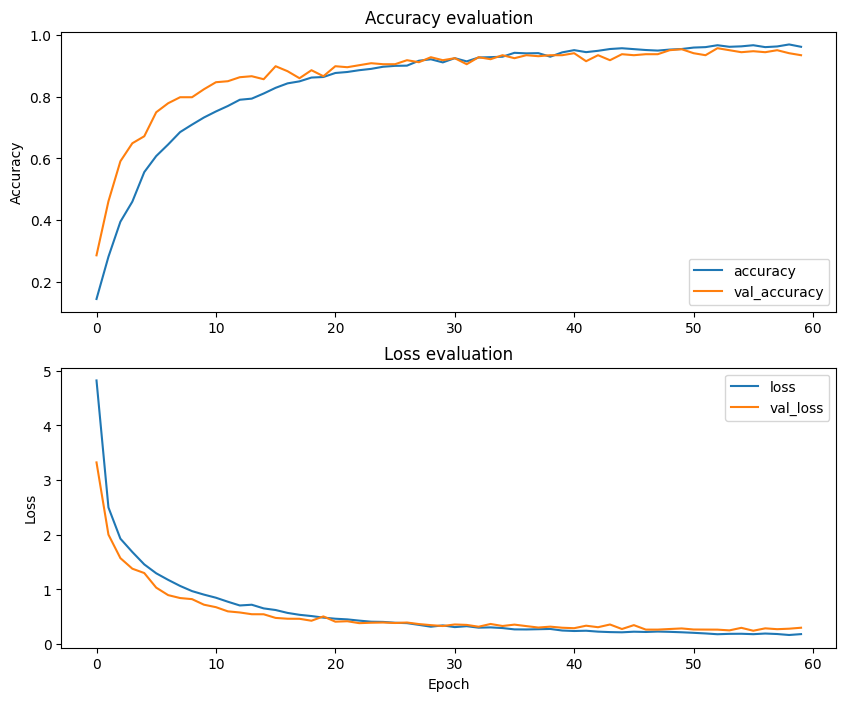

42/42 [==============================] - 1s 11ms/step - loss: 0.2575 - accuracy: 0.9415

Test loss: 0.2575128674507141, test accuracy: 94.15338039398193


<Figure size 640x480 with 0 Axes>

In [ ]:
import json
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from ann_visualizer.visualize import ann_viz
from datetime import datetime
from packaging import version



logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)
DATA_PATH = "data2.json"
SAVED_MODEL_PATH = "model02.keras"
EPOCHS = 60
BATCH_SIZE = 10
PATIENCE = 5
LEARNING_RATE = 0.0001


def load_data(data_path):

    with open(data_path, "r") as fp:
        data = json.load(fp)

    X = np.array(data["MFCCs"])
    y = np.array(data["labels"])
    print("Training sets loaded!")
    return X, y

def prepare_dataset(data_path, test_size=0.3, validation_size=0.1):


    # load dataset
    X, y = load_data(data_path)

    # create train, validation, test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size)
    #X_train = X_train.reshape(X_train.shape[0], -1) #modified
    X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, test_size=validation_size)

    # add an axis to nd array
    X_train = X_train[..., np.newaxis]
    X_test = X_test[..., np.newaxis]
    X_validation = X_validation[..., np.newaxis]

    return X_train, y_train, X_validation, y_validation, X_test, y_test


def build_model(input_shape, loss="sparse_categorical_crossentropy", learning_rate=0.0001):



    # build network architecture using convolutional layers
    print("Input Shape:",input_shape)
    model = tf.keras.models.Sequential()

    # 1st conv layer
    model.add(tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=input_shape,
                                     kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((3, 3), strides=(2,2), padding='same'))
    # 2nd conv layer
    model.add(tf.keras.layers.Conv2D(32, (3, 3), activation='relu',
                                     kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((3, 3), strides=(2,2), padding='same'))

    # 3rd conv layer
    model.add(tf.keras.layers.Conv2D(32, (2, 2), activation='relu',
                                     kernel_regularizer=tf.keras.regularizers.l2(0.001)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.MaxPooling2D((2, 2), strides=(2,2), padding='same'))
    # flatten output and feed into dense layer
    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(64, activation='relu'))
    model.add(tf.keras.layers.Dropout(0.3))

    # softmax output layer
    model.add(tf.keras.layers.Dense(455, activation='softmax'))

    optimiser = tf.optimizers.Adam(learning_rate=learning_rate)
    # compile model
    model.compile(optimizer=optimiser,
                  loss=loss,
                  metrics=["accuracy"])

    # print model parameters on console
    model.summary()
    return model


    # Your training code here
    # Make sure you use the epochs, batch_size, and patience arguments appropriately

"""def train(model, epochs, batch_size, patience, X_train, y_train, X_validation, y_validation):


    earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="accuracy", min_delta=0.001, patience=patience)

    # train model
    history = model.fit(X_train,
                        y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(X_validation, y_validation),
                        callbacks=[earlystop_callback])
    return history"""
def train(model, epochs, batch_size, patience, X_train, y_train, X_validation, y_validation):
    earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="accuracy", min_delta=0.001, patience=patience)

    # Train the model
    history = model.fit(
        X_train,
        y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_validation, y_validation),
        callbacks=[tensorboard_callback]
    )

    return history



def plot_history(history):


    fig, axs = plt.subplots(2,figsize=(10, 8))

    # create accuracy subplot
    axs[0].plot(history.history["accuracy"], label="accuracy")
    axs[0].plot(history.history['val_accuracy'], label="val_accuracy")
    axs[0].set_ylabel("Accuracy")
    axs[0].legend(loc="lower right")
    axs[0].set_title("Accuracy evaluation")
    plt.savefig("acuuracy.jpg")
    # create loss subplot
    axs[1].plot(history.history["loss"], label="loss")
    axs[1].plot(history.history['val_loss'], label="val_loss")
    axs[1].set_xlabel("Epoch")
    axs[1].set_ylabel("Loss")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Loss evaluation")
    plt.savefig("loss.jpg")
    plt.show()




def main():
    # generate train, validation and test sets
    X_train, y_train, X_validation, y_validation, X_test, y_test = prepare_dataset(DATA_PATH)

    # create network
    input_shape = (X_train.shape[1], X_train.shape[2], 1)
    print(input_shape)
    model = build_model(input_shape, learning_rate=LEARNING_RATE)
    # train network
    print('history')
    history = train(model, EPOCHS,PATIENCE,BATCH_SIZE, X_train, y_train, X_validation, y_validation)

    #history = train(model, 60, 10, 5, X_train, y_train, X_validation, y_validation)


    # plot accuracy/loss for training/validation set as a function of the epochs
    plot_history(history)
    plt.savefig("history.png")
    # evaluate network on test set

    test_loss, test_acc = model.evaluate(X_test, y_test)
    print("\nTest loss: {}, test accuracy: {}".format(test_loss, 100*test_acc))

    # save model
    model.save(SAVED_MODEL_PATH)


if __name__ == "__main__":
    main()

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import tensorboard
tensorboard.__version__

'2.15.2'

In [ ]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 12824), started 0:18:47 ago. (Use '!kill 12824' to kill it.)

<IPython.core.display.Javascript object>

# **Accuracy Calculation**

In [ ]:
import librosa
import tensorflow as tf
import numpy as np

SAVED_MODEL_PATH = "model02.keras"
SAMPLES_TO_CONSIDER = 16000

class _Keyword_Spotting_Service:
    """Singleton class for keyword spotting inference with trained models."""

    _model = None
    _mapping = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"
    ]
    _instance = None

    def __init__(self):
        self._model = self.load_model()  # Initialize the model during object creation

    def load_model(self):
        """Load the trained model."""
        return tf.keras.models.load_model(SAVED_MODEL_PATH)

    def predict(self, file_path):
        """Predicts the keyword from an audio file."""

        # extract MFCC
        MFCCs = self.preprocess(file_path)

        if MFCCs is None:
            return "unknown"  # Handle if preprocessing fails

        # we need a 4-dim array to feed to the model for prediction: (# samples, # time steps, # coefficients, 1)
        MFCCs = MFCCs[np.newaxis, ..., np.newaxis]

        # get the predicted label
        predictions = self._model.predict(MFCCs)  # Use the class attribute
        predicted_index = np.argmax(predictions)

        # Ensure the predicted_index is within the range of classes
        if predicted_index < len(self._mapping):
            predicted_keyword = self._mapping[predicted_index]
        else:
            predicted_keyword = "unknown"  # Handle if index is out of range

        return predicted_keyword

    def preprocess(self, file_path, num_mfcc=13, n_fft=2048, hop_length=512):
        """Extract MFCCs from audio file."""
        # ... (existing code)
        # load audio file
        signal, sample_rate = librosa.load(file_path)

        if len(signal) >= SAMPLES_TO_CONSIDER:
            # ensure consistency of the length of the signal
            signal = signal[:SAMPLES_TO_CONSIDER]

            # extract MFCCs
            #MFCCs = librosa.feature.mfcc(signal, sample_rate, n_mfcc=num_mfcc, n_fft=n_fft,hop_length=hop_length)
            MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
        return MFCCs.T

def Keyword_Spotting_Service():
    """Factory function for Keyword_Spotting_Service class."""
    if _Keyword_Spotting_Service._instance is None:
        _Keyword_Spotting_Service._instance = _Keyword_Spotting_Service()

    return _Keyword_Spotting_Service._instance

if __name__ == "__main__":
    # ... (existing code)
    # create 2 instances of the keyword spotting service
    kss = Keyword_Spotting_Service()
    kss1 = Keyword_Spotting_Service()

    # check that different instances of the keyword spotting service point back to the same object (singleton)
    assert kss is kss1
    # create an instance of the keyword spotting service
    #kss = Keyword_Spotting_Service()

    # make a prediction
    audio_folder = '/content/drive/MyDrive/Test/acoff'
    count=0
    correct_prediction=0
    for filename in os.listdir(audio_folder):
      count=count+1
      if filename.endswith('.wav'):  # Adjust the file format as needed
        audio_path = os.path.join(audio_folder, filename)
    #audio_path =  '/content/drive/MyDrive/Test/acoff/i2_acoff_12.wav'

# Specify the file path
# Get the directory of the file
      file_directory = os.path.basename(os.path.dirname(audio_path))

# Print the directory
      keyword = kss.predict(audio_path)
      if(file_directory==keyword):
        correct_prediction+=1

      print(file_directory,keyword)
    print('accuracy:',(correct_prediction/count)*100)
    print(count)
    print(correct_prediction)



1/1 [==============================] - 0s 156ms/step
acoff acoff
1/1 [==============================] - 0s 38ms/step
acoff acoff
1/1 [==============================] - 0s 36ms/step
acoff acoff
1/1 [==============================] - 0s 28ms/step
acoff acoff
1/1 [==============================] - 0s 27ms/step
acoff acoff
1/1 [==============================] - 0s 32ms/step
acoff acoff
1/1 [==============================] - 0s 31ms/step
acoff acoff
1/1 [==============================] - 0s 26ms/step
acoff acoff
1/1 [==============================] - 0s 37ms/step
acoff acoff
1/1 [==============================] - 0s 42ms/step
acoff acoff
1/1 [==============================] - 0s 30ms/step
acoff acoff
1/1 [==============================] - 0s 30ms/step
acoff acoff
1/1 [==============================] - 0s 29ms/step
acoff acoff
1/1 [==============================] - 0s 26ms/step
acoff acoff
1/1 [==============================] - 0s 34ms/step
acoff acoff
1/1 [==============================] - 

## **Command Accuracy**

In [ ]:
y_test=[]
y_pred=[]

In [ ]:
import librosa
import tensorflow as tf
import numpy as np

SAVED_MODEL_PATH = "model02.keras"
SAMPLES_TO_CONSIDER = 16000

class _Keyword_Spotting_Service:
    """Singleton class for keyword spotting inference with trained models."""

    _model = None
    _mapping = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"
    ]
    _instance = None

    def __init__(self):
        self._model = self.load_model()  # Initialize the model during object creation

    def load_model(self):
        """Load the trained model."""
        return tf.keras.models.load_model(SAVED_MODEL_PATH)

    def predict(self, file_path):
        """Predicts the keyword from an audio file."""

        # extract MFCC
        MFCCs = self.preprocess(file_path)

        if MFCCs is None:
            return "unknown"  # Handle if preprocessing fails

        # we need a 4-dim array to feed to the model for prediction: (# samples, # time steps, # coefficients, 1)
        MFCCs = MFCCs[np.newaxis, ..., np.newaxis]

        # get the predicted label
        predictions = self._model.predict(MFCCs)  # Use the class attribute
        predicted_index = np.argmax(predictions)

        # Ensure the predicted_index is within the range of classes
        if predicted_index < len(self._mapping):
            predicted_keyword = self._mapping[predicted_index]
        else:
            predicted_keyword = "unknown"  # Handle if index is out of range

        return predicted_keyword

    def preprocess(self, file_path, num_mfcc=13, n_fft=2048, hop_length=512):
        """Extract MFCCs from audio file."""
        # ... (existing code)
        # load audio file
        signal, sample_rate = librosa.load(file_path)

        if len(signal) >= SAMPLES_TO_CONSIDER:
            # ensure consistency of the length of the signal
            signal = signal[:SAMPLES_TO_CONSIDER]

            # extract MFCCs
            #MFCCs = librosa.feature.mfcc(signal, sample_rate, n_mfcc=num_mfcc, n_fft=n_fft,hop_length=hop_length)
            MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
        return MFCCs.T

def Keyword_Spotting_Service():
    """Factory function for Keyword_Spotting_Service class."""
    if _Keyword_Spotting_Service._instance is None:
        _Keyword_Spotting_Service._instance = _Keyword_Spotting_Service()

    return _Keyword_Spotting_Service._instance

if __name__ == "__main__":
    # ... (existing code)
    # create 2 instances of the keyword spotting service
    kss = Keyword_Spotting_Service()
    kss1 = Keyword_Spotting_Service()

    # check that different instances of the keyword spotting service point back to the same object (singleton)
    assert kss is kss1
    # create an instance of the keyword spotting service
    #kss = Keyword_Spotting_Service()

    # make a prediction
    #audio_folder = '/content/drive/MyDrive/Train/tvoff'
    test_dir = '/content/drive/MyDrive/Test-2'
    labels=[]
    accuracy=[]

    count=0
    correct_prediction=0

    #audio_path =  '/content/drive/MyDrive/Test/acoff/i2_acoff_12.wav'
    for subfolder in os.listdir(test_dir):

      print(subfolder)
      subfolder_path = os.path.join(test_dir, subfolder)
      files_in_directory=0
      Individual_correct_predictions=0
      wrong_predicted_files=[]
      if os.path.isdir(subfolder_path):
        # Iterate through the audio files in each subfolder
        for audio_file in os.listdir(subfolder_path):
            files_in_directory+=1
            audio_file_path = os.path.join(subfolder_path, audio_file)
            #print(audio_file_path)
            file_directory = os.path.basename(os.path.dirname(audio_file_path))
            keyword = kss.predict(audio_file_path)
            count=count+1
            y_test.append(subfolder)
            y_pred.append(keyword)
            if(subfolder==keyword):
                Individual_correct_predictions+=1
                correct_prediction+=1
            else:
              wrong_predicted_files.append(audio_file_path)


            print(file_directory,keyword)

        print("Wrongly Predicted Files:",files_in_directory-Individual_correct_predictions)
        for files in wrong_predicted_files:
          print(files)
        print("total file:",files_in_directory)
        print("correctly predicted files:",Individual_correct_predictions)
        print("Accuracy of",subfolder,(Individual_correct_predictions/files_in_directory)*100,"\n\n")
        labels.append(subfolder)
        accuracy.append((Individual_correct_predictions/files_in_directory)*100)
# Print the directory

    prediction=dict(zip(labels,accuracy))
    print('accuracy:',(correct_prediction/count)*100)
    print(count)
    print(correct_prediction)
    print(prediction)




tvoff
1/1 [==============================] - 0s 191ms/step
tvoff lighton
1/1 [==============================] - 0s 44ms/step
tvoff tvoff
1/1 [==============================] - 0s 24ms/step
tvoff lighton
1/1 [==============================] - 0s 33ms/step
tvoff acon
1/1 [==============================] - 0s 35ms/step
tvoff tvoff
1/1 [==============================] - 0s 35ms/step
tvoff tvoff
1/1 [==============================] - 0s 39ms/step
tvoff tvoff
1/1 [==============================] - 0s 33ms/step
tvoff tvoff
1/1 [==============================] - 0s 37ms/step
tvoff tvoff
1/1 [==============================] - 0s 32ms/step
tvoff tvoff
1/1 [==============================] - 0s 36ms/step
tvoff tvoff
1/1 [==============================] - 0s 40ms/step
tvoff tvoff
1/1 [==============================] - 0s 48ms/step
tvoff tvoff
1/1 [==============================] - 0s 42ms/step
tvoff tvoff
1/1 [==============================] - 0s 43ms/step
tvoff tvoff
1/1 [=========================

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

In [ ]:
print(cm)

[[157   4   0   0   0   0   0   0   0   0]
 [  3 152   0   2   0   0   0   0   0   7]
 [  0   0 176   2   1   0   0   0   0   0]
 [  0   0  10 147   0   0   2   4   0   4]
 [  0   2   1   2 166   0   0   0   0   0]
 [  0   0   6   1   1 143   2   0   0   1]
 [  0   0   0   0   0   1 161   4   0   0]
 [  0   8   5  20   0   0   4 153   0   4]
 [  0   0   0   0   0   0   0   0 141   1]
 [  0   1   0   4   0   0   0   0   2 155]]


In [ ]:
cm_df = pd.DataFrame(cm,index = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"
    ],columns = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"
    ])

In [ ]:
from sklearn.metrics import precision_recall_fscore_support
precision, recall, f1_score, support = precision_recall_fscore_support(y_test, y_pred)
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-score: {f1_score}")
print(f"Support: {support}")

Precision: [0.98125    0.92571429 0.96089385 0.87573964 0.95209581 0.88198758
 0.89204545 0.93442623 1.         0.92121212]
Recall: [0.97515528 0.98780488 0.96089385 0.88622754 0.92982456 0.92207792
 0.94578313 0.8814433  0.88028169 0.9382716 ]
F1-score: [0.97819315 0.95575221 0.96089385 0.88095238 0.9408284  0.9015873
 0.91812865 0.9071618  0.93632959 0.92966361]
Support: [161 164 179 167 171 154 166 194 142 162]


# **Comparison Between Precisionn, Recall and f1-Score of CNN using MFCC's**

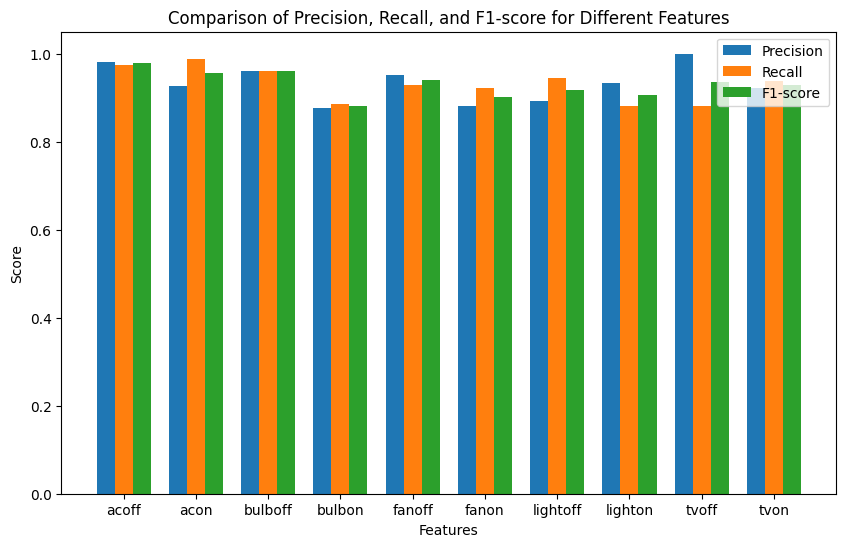

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Replace these values with your actual precision, recall, and F1-score arrays
precision = np.array([0.98125, 0.92571429, 0.96089385, 0.87573964, 0.95209581, 0.88198758, 0.89204545, 0.93442623, 1.0, 0.92121212])
recall = np.array([0.97515528, 0.98780488, 0.96089385, 0.88622754, 0.92982456, 0.92207792, 0.94578313, 0.8814433, 0.88028169, 0.9382716])
f1_score = np.array([0.97819315, 0.95575221, 0.96089385, 0.88095238, 0.9408284, 0.9015873, 0.91812865, 0.9071618, 0.93632959, 0.92966361])

features = ["acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"]

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.25
index = np.arange(len(features))

bar1 = ax.bar(index, precision, bar_width, label='Precision')
bar2 = ax.bar(index + bar_width, recall, bar_width, label='Recall')
bar3 = ax.bar(index + 2 * bar_width, f1_score, bar_width, label='F1-score')

ax.set_xlabel('Features')
ax.set_ylabel('Score')
ax.set_title('Comparison of Precision, Recall, and F1-score for Different Features')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(features)
ax.legend()

plt.show()


# **Comparison Between Precisionn, Recall and f1-Score of HMM using MFCC's**

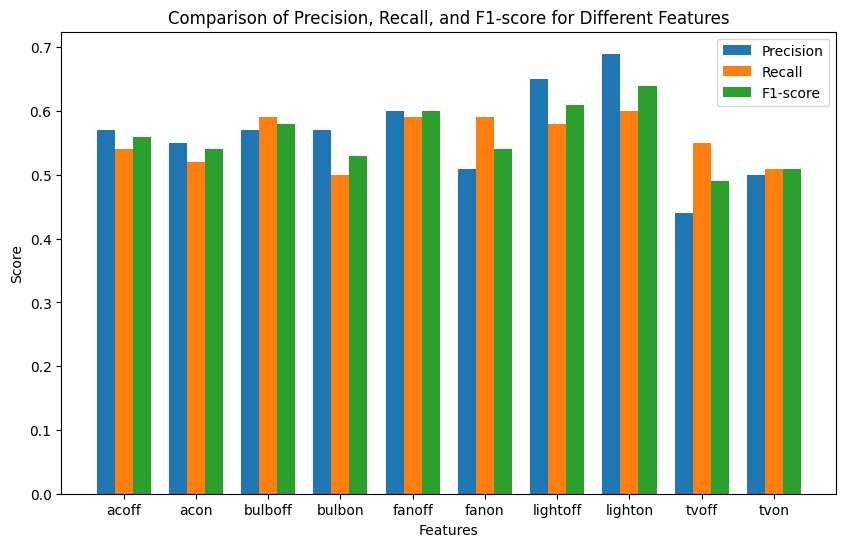

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Replace these values with your actual precision, recall, and F1-score arrays
precision = [0.57, 0.55, 0.57, 0.57, 0.60, 0.51, 0.65, 0.69, 0.44, 0.50]
recall = [0.54, 0.52, 0.59, 0.50, 0.59, 0.59, 0.58, 0.60, 0.55, 0.51]
f1_score = [0.56, 0.54, 0.58, 0.53, 0.60, 0.54, 0.61, 0.64, 0.49, 0.51]
features = ["acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"]

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))

bar_width = 0.25
index = np.arange(len(features))

bar1 = ax.bar(index, precision, bar_width, label='Precision')
bar2 = ax.bar(index + bar_width, recall, bar_width, label='Recall')
bar3 = ax.bar(index + 2 * bar_width, f1_score, bar_width, label='F1-score')

ax.set_xlabel('Features')
ax.set_ylabel('Score')
ax.set_title('Comparison of Precision, Recall, and F1-score for Different Features')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(features)
ax.legend()

plt.show()


# **Confusion Matrix of CNN with mfcc**

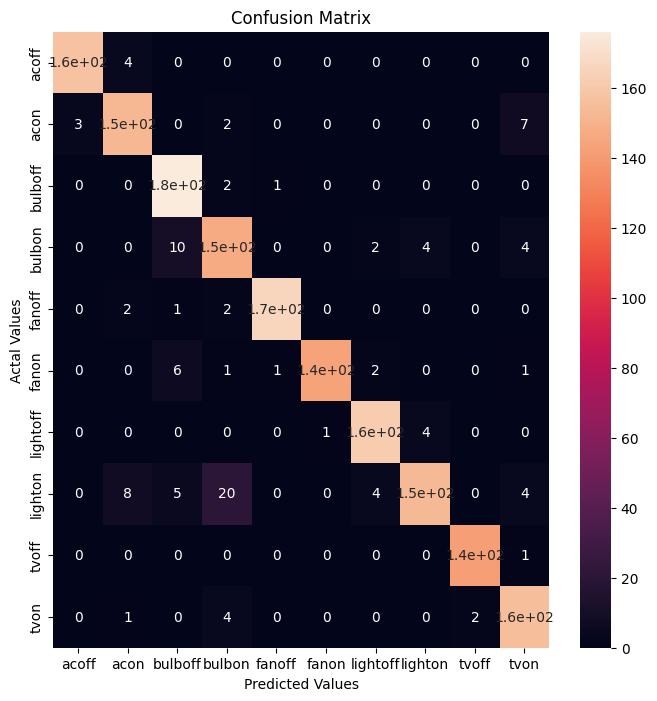

In [ ]:
import seaborn as sns
plt.figure(figsize=(8,8))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

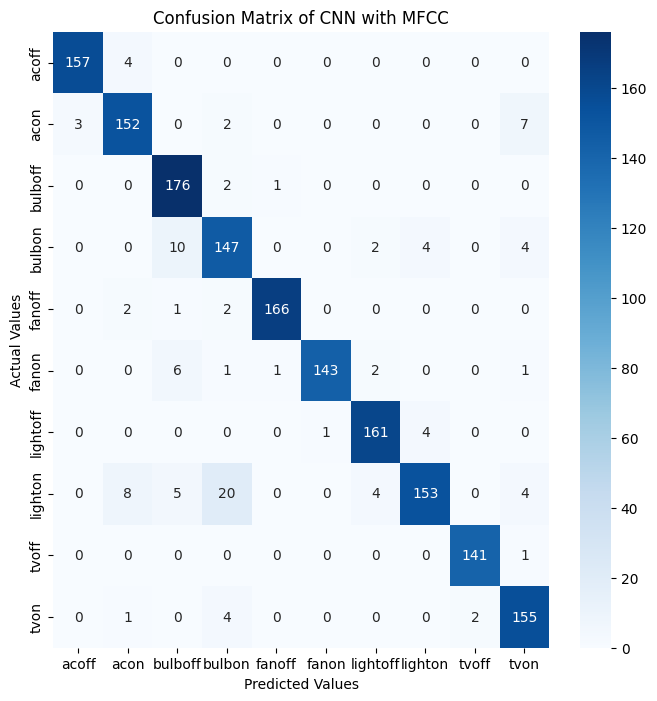

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming cm_df is your confusion matrix DataFrame
plt.figure(figsize=(6, 9))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')  # Use 'd' to format values as integers
plt.title('Confusion Matrix of CNN with MFCC')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()


## **Speakers Accuracy**

In [ ]:
import librosa
import tensorflow as tf
import numpy as np

SAVED_MODEL_PATH = "model02.keras"
SAMPLES_TO_CONSIDER = 16000

class _Keyword_Spotting_Service:
    """Singleton class for keyword spotting inference with trained models."""

    _model = None
    _mapping = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"
    ]
    _instance = None

    def __init__(self):
        self._model = self.load_model()  # Initialize the model during object creation

    def load_model(self):
        """Load the trained model."""
        return tf.keras.models.load_model(SAVED_MODEL_PATH)

    def predict(self, file_path):
        """Predicts the keyword from an audio file."""

        # extract MFCC
        MFCCs = self.preprocess(file_path)

        if MFCCs is None:
            return "unknown"  # Handle if preprocessing fails

        # we need a 4-dim array to feed to the model for prediction: (# samples, # time steps, # coefficients, 1)
        MFCCs = MFCCs[np.newaxis, ..., np.newaxis]

        # get the predicted label
        predictions = self._model.predict(MFCCs)  # Use the class attribute
        predicted_index = np.argmax(predictions)

        # Ensure the predicted_index is within the range of classes
        if predicted_index < len(self._mapping):
            predicted_keyword = self._mapping[predicted_index]
        else:
            predicted_keyword = "unknown"  # Handle if index is out of range

        return predicted_keyword

    def preprocess(self, file_path, num_mfcc=13, n_fft=2048, hop_length=512):
        """Extract MFCCs from audio file."""
        # ... (existing code)
        # load audio file
        signal, sample_rate = librosa.load(file_path)

        if len(signal) >= SAMPLES_TO_CONSIDER:
            # ensure consistency of the length of the signal
            signal = signal[:SAMPLES_TO_CONSIDER]

            # extract MFCCs
            #MFCCs = librosa.feature.mfcc(signal, sample_rate, n_mfcc=num_mfcc, n_fft=n_fft,hop_length=hop_length)
            MFCCs = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
        return MFCCs.T

def Keyword_Spotting_Service():
    """Factory function for Keyword_Spotting_Service class."""
    if _Keyword_Spotting_Service._instance is None:
        _Keyword_Spotting_Service._instance = _Keyword_Spotting_Service()

    return _Keyword_Spotting_Service._instance

if __name__ == "__main__":
    # ... (existing code)
    # create 2 instances of the keyword spotting service
    kss = Keyword_Spotting_Service()
    kss1 = Keyword_Spotting_Service()

    # check that different instances of the keyword spotting service point back to the same object (singleton)
    assert kss is kss1
    # create an instance of the keyword spotting service
    #kss = Keyword_Spotting_Service()

    # make a prediction
    #audio_folder = '/content/drive/MyDrive/Train/tvoff'
    main='/content/drive/MyDrive/NewTestData/dataset-1'
    for mainfolder in os.listdir(main):
      test_dir = os.path.join(main,mainfolder)
      labels=[]
      accuracy=[]

      count=0
      correct_prediction=0

    #audio_path =  '/content/drive/MyDrive/Test/acoff/i2_acoff_12.wav'
      for subfolder in os.listdir(test_dir):

        print(subfolder)
        subfolder_path = os.path.join(test_dir, subfolder)
        files_in_directory=0
        Individual_correct_predictions=0
        wrong_predicted_files=[]
        if os.path.isdir(subfolder_path):
        # Iterate through the audio files in each subfolder
          for audio_file in os.listdir(subfolder_path):
              files_in_directory+=1
              audio_file_path = os.path.join(subfolder_path, audio_file)
              #print(audio_file_path)
              file_directory = os.path.basename(os.path.dirname(audio_file_path))
              keyword = kss.predict(audio_file_path)
              print(audio_file)
              count=count+1
              if(subfolder==keyword):
                 Individual_correct_predictions+=1
                 correct_prediction+=1
              else:
                wrong_predicted_files.append(audio_file_path)

              #print(file_directory,keyword)
          print("Wrongly Predicted Files:",files_in_directory-Individual_correct_predictions)
          for files in wrong_predicted_files:
            print(files)
          print("total file:",files_in_directory)
          print("correctly predicted files:",Individual_correct_predictions)
          print("Wrongly Predicted Files:",files_in_directory-Individual_correct_predictions)
          try:
            print("Accuracy of",subfolder,(Individual_correct_predictions/files_in_directory)*100,"\n\n")
          except:
            print("Divison with zero")
          labels.append(subfolder)
          try:
            accuracy.append((Individual_correct_predictions/files_in_directory)*100)
          except:
            print("Divison with zero")
# Print the directory

      prediction=dict(zip(labels,accuracy))
      print(test_dir)
      print('accuracy:',(correct_prediction/count)*100)
      print(count)
      print(correct_prediction)
      print(prediction)




fanoff
1/1 [==============================] - 0s 134ms/step
24_fanoff_8.wav
1/1 [==============================] - 0s 34ms/step
24_fanoff_4.wav
1/1 [==============================] - 0s 29ms/step
24_fanoff_12.wav
1/1 [==============================] - 0s 33ms/step
24_fanoff_10.wav
1/1 [==============================] - 0s 28ms/step
24_fanoff_19.wav
1/1 [==============================] - 0s 32ms/step
24_fanoff_2.wav
1/1 [==============================] - 0s 31ms/step
24_fanoff_3.wav
1/1 [==============================] - 0s 29ms/step
24_fanoff_9.wav
1/1 [==============================] - 0s 28ms/step
24_fanoff_17.wav
1/1 [==============================] - 0s 31ms/step
24_fanoff_15.wav
1/1 [==============================] - 0s 32ms/step
24_fanoff_7.wav
1/1 [==============================] - 0s 27ms/step
24_fanoff_5.wav
1/1 [==============================] - 0s 27ms/step
24_fanoff_16.wav
1/1 [==============================] - 0s 43ms/step
24_fanoff_1.wav
1/1 [=============================

# **Graphs**

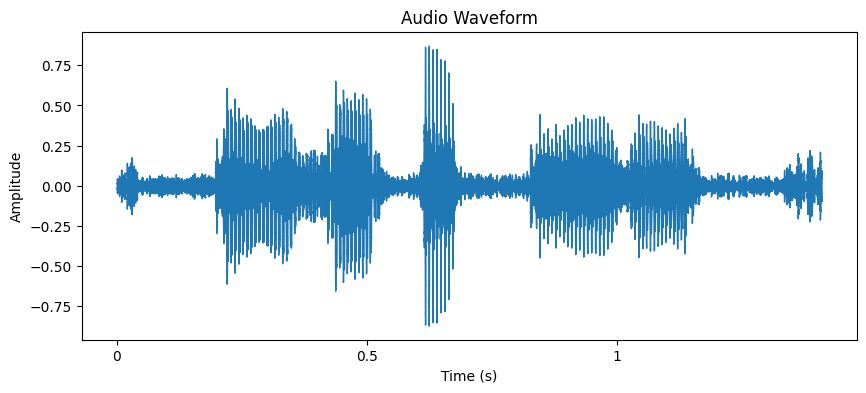

In [ ]:
import librosa
import matplotlib.pyplot as plt

# Load the audio file
audio, sample_rate = librosa.load('/content/drive/MyDrive/Test/tvon/j3_tvon_4.wav')

# Create a time-domain plot
plt.figure(figsize=(10, 4))
librosa.display.waveshow(audio, sr=sample_rate)
plt.title('Audio Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.savefig("Raw_Signal.jpg")
plt.show()


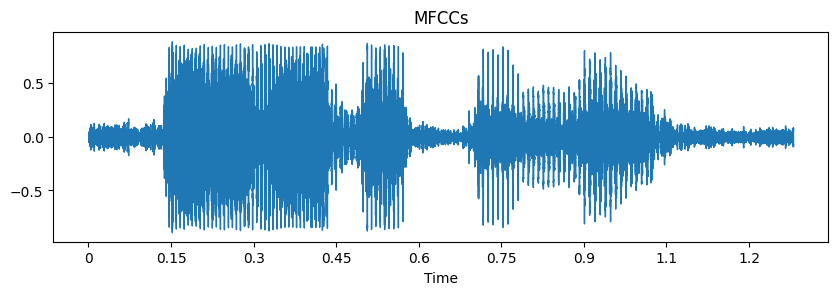

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)  # You can adjust n_mfcc as needed

# Plot waveform
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('MFCCs')


# Plot MFCCs

plt.show()


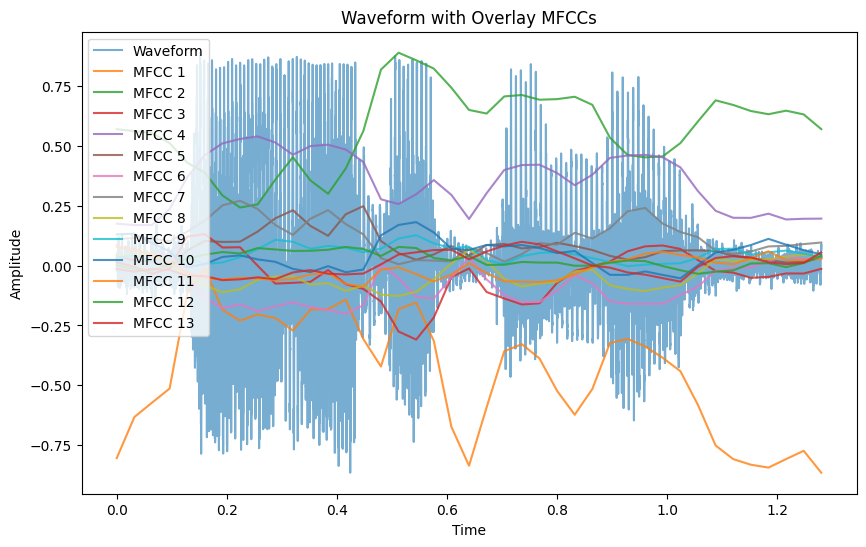

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Normalize MFCCs to be in the range of the waveform amplitude
mfccs = np.interp(mfccs, (mfccs.min(), mfccs.max()), (y.min(), y.max()))

# Create time array for MFCCs
mfccs_time = np.linspace(0, librosa.get_duration(y=y, sr=sr), num=mfccs.shape[1])

# Plot waveform
plt.figure(figsize=(10, 6))
plt.plot(np.linspace(0, librosa.get_duration(y=y, sr=sr), num=len(y)), y, label='Waveform', alpha=0.6)

# Overlay MFCCs on waveform plot
for i in range(mfccs.shape[0]):
    plt.plot(mfccs_time, mfccs[i], label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Waveform with Overlay MFCCs')
plt.legend()
plt.show()


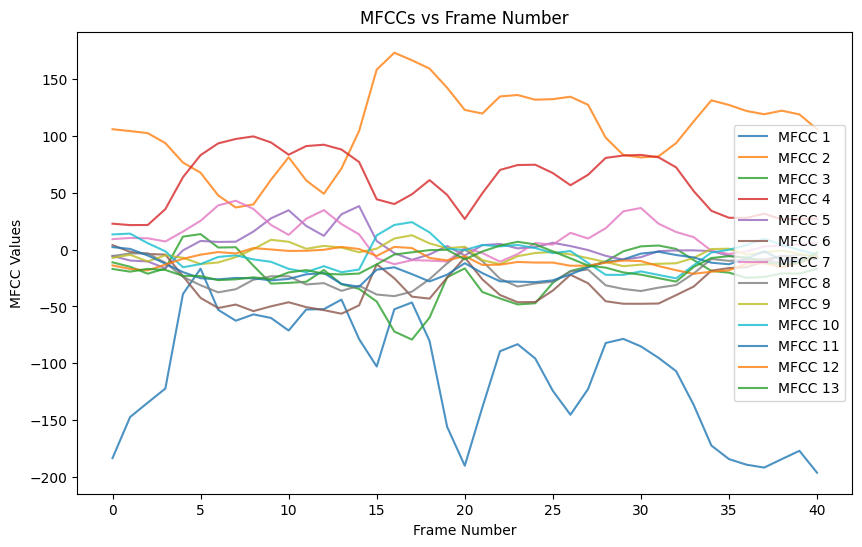

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number')
plt.ylabel('MFCC Values')
plt.title('MFCCs vs Frame Number')
plt.legend()
plt.show()


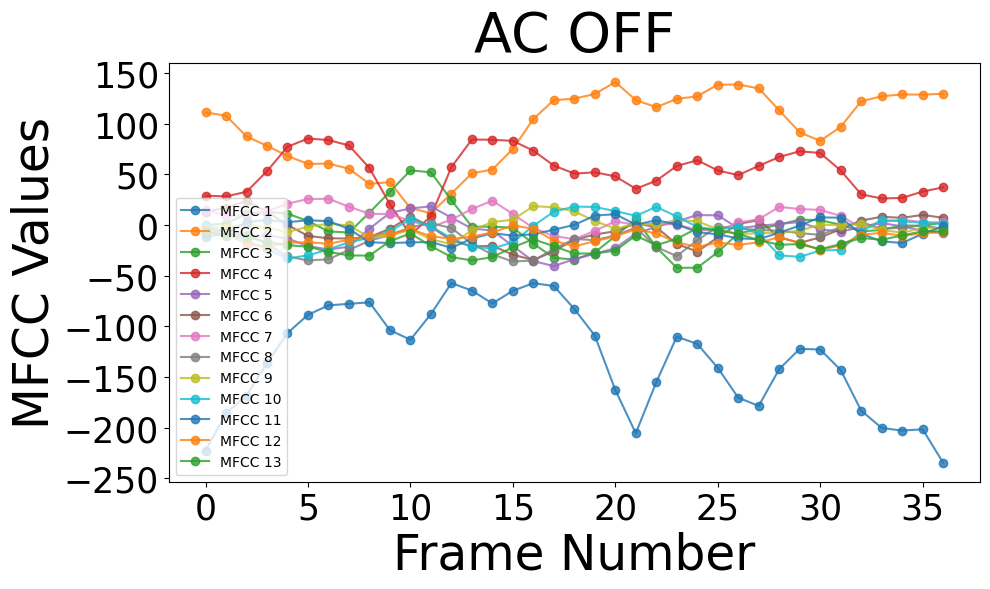

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))

num_frames = mfccs.shape[1]  # Get the number of frames
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], label=f'MFCC {i+1}', alpha=0.8, marker='o', linestyle='-')

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('AC OFF', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('acoff_mfcc.jpg')
plt.show()


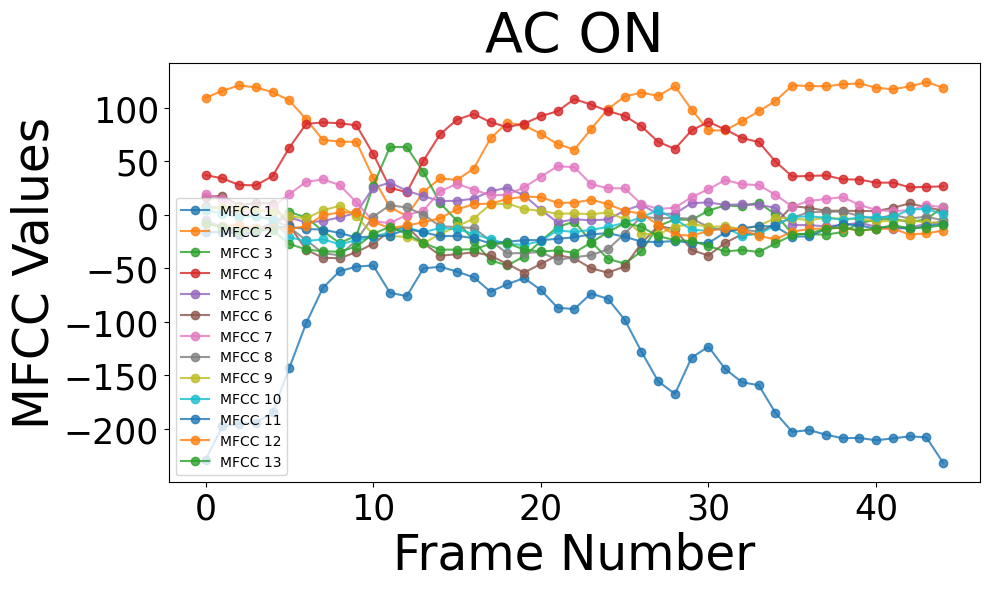

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/acon/H7_acon_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('AC ON', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('acon_mfcc.jpg')
plt.show()


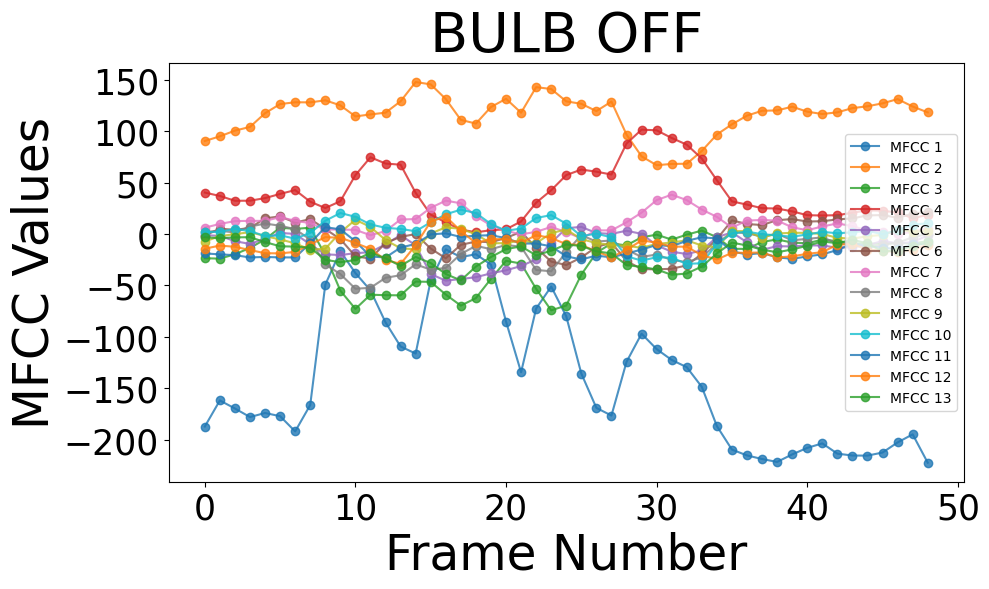

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('BULB OFF', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('bulboff_mfcc.jpg')
plt.show()


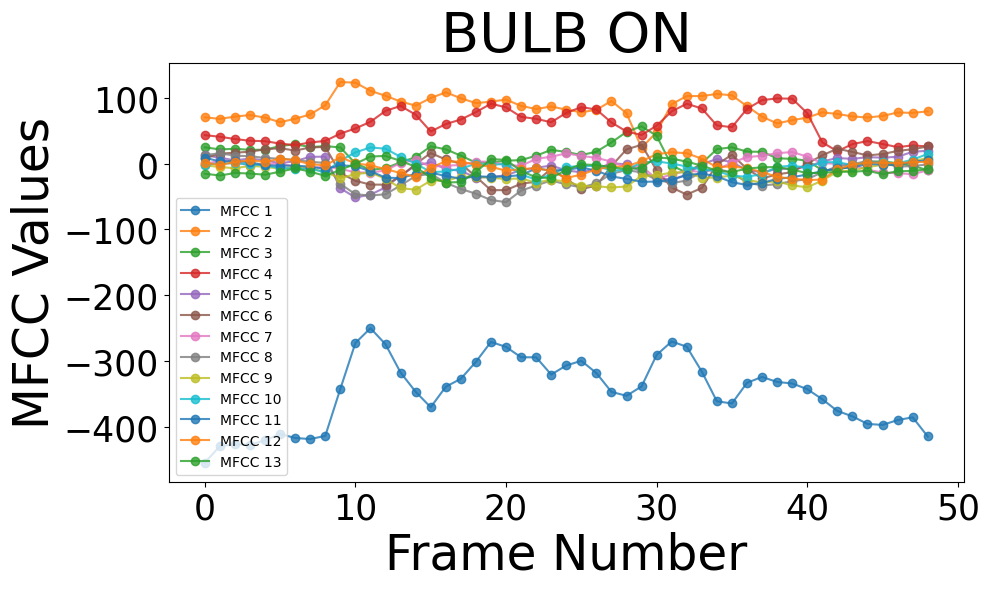

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('BULB ON', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('bulbon_mfcc.jpg')
plt.show()


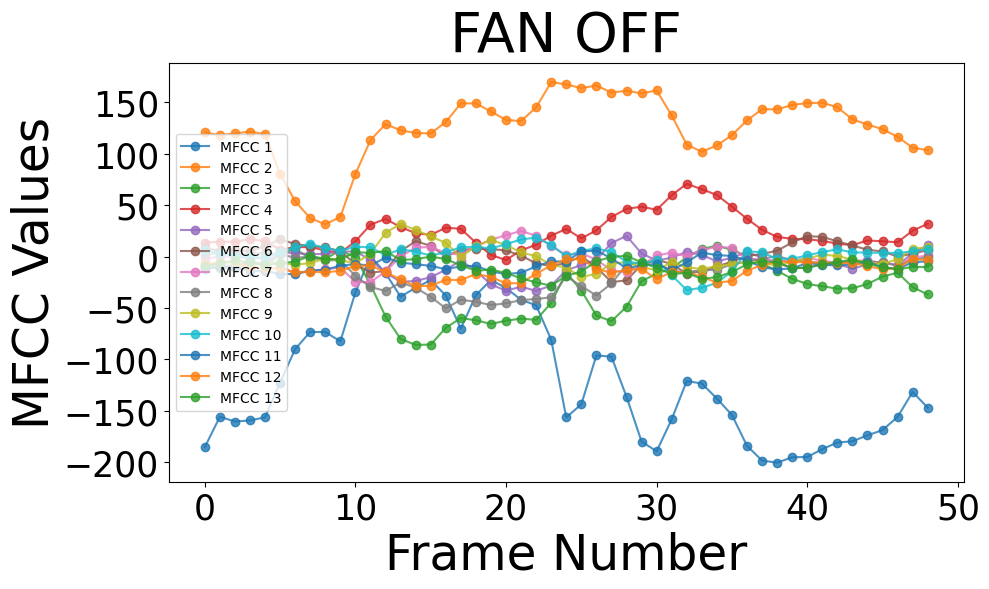

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_10.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('FAN OFF', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('fanoff_mfcc.jpg')
plt.show()

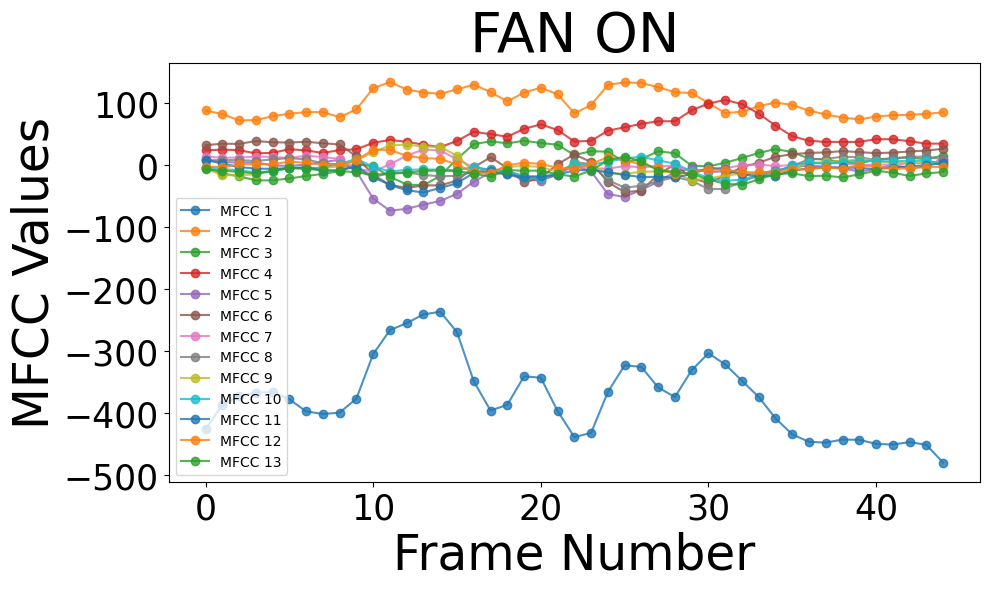

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('FAN ON', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('fanon_mfcc.jpg')
plt.show()

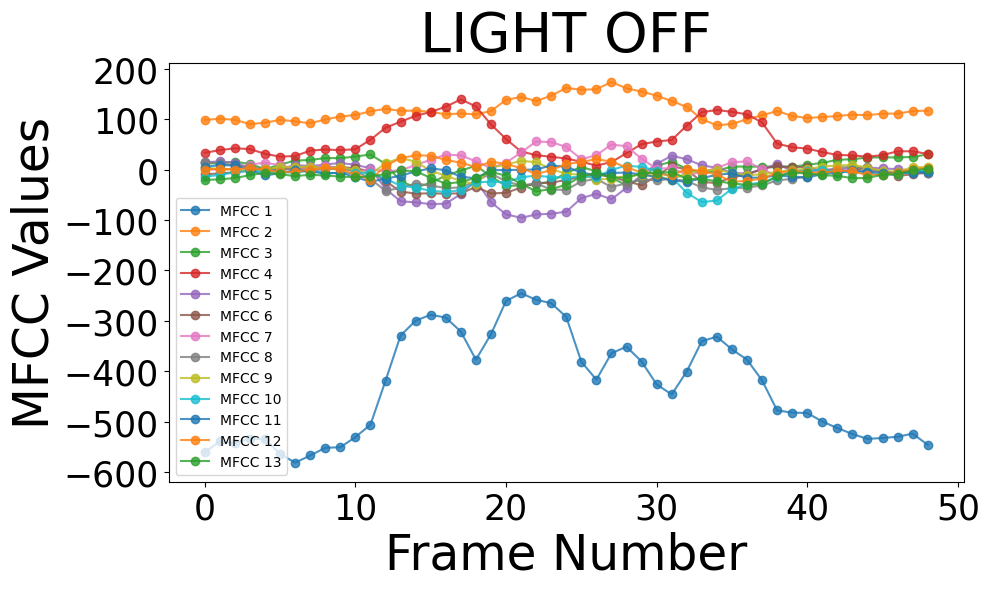

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('LIGHT OFF', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('lightoff_mfcc.jpg')
plt.show()

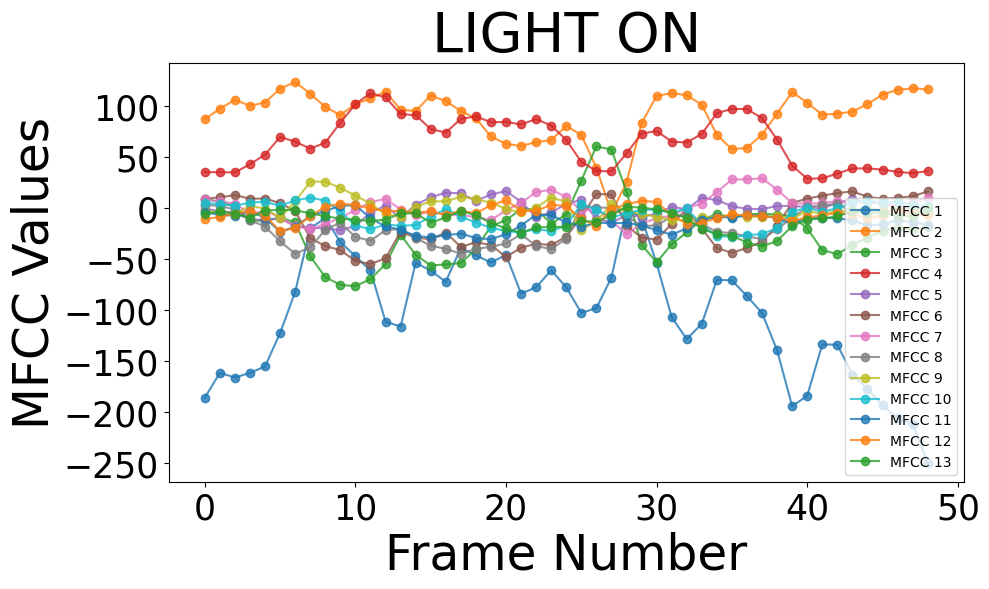

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('LIGHT ON', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('lighton_mfcc.jpg')
plt.show()

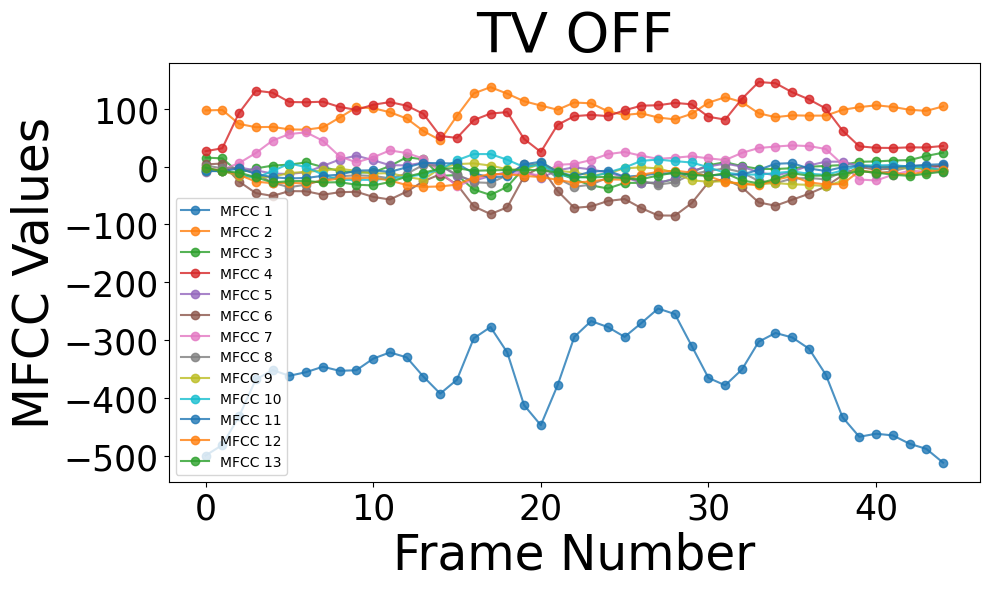

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)
plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('TV OFF', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('tvoff_mfcc.jpg')
plt.show()

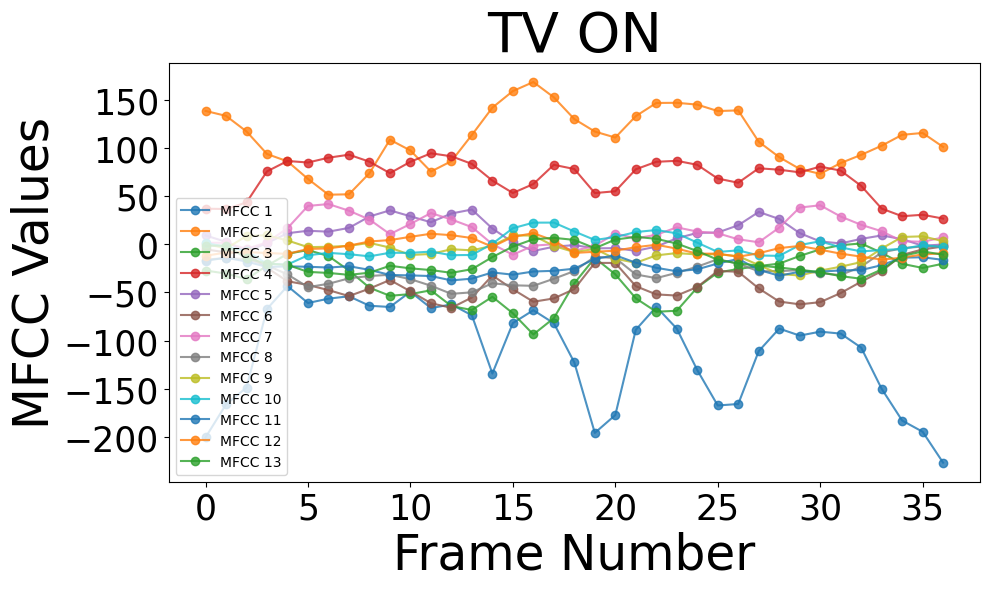

In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_1.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Plotting MFCCs vs. frame number with connecting lines
plt.figure(figsize=(10, 6))
num_frames = mfccs.shape[1]  # Get the number of frames

# Create an array for the frame numbers
frame_numbers = np.arange(0, num_frames)

for i in range(mfccs.shape[0]):
    plt.plot(frame_numbers, mfccs[i], marker='o', linestyle='-', label=f'MFCC {i+1}', alpha=0.8)

plt.xlabel('Frame Number', fontsize=35)  # Adjust x-label font size
plt.ylabel('MFCC Values', fontsize=35)   # Adjust y-label font size
plt.title('TV ON', fontsize=40)  # Adjust title font size
plt.xticks(fontsize=25)  # Adjust x-axis tick font size
plt.yticks(fontsize=25)  # Adjust y-axis tick font size
plt.legend()
plt.tight_layout()
plt.savefig('tvon_mfcc.jpg')
plt.show()

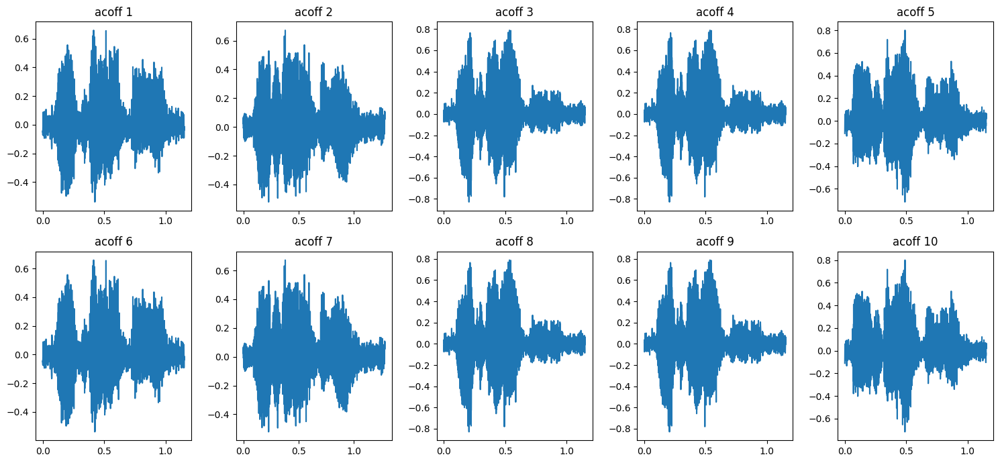

In [ ]:
import matplotlib.pyplot as plt
import librosa
import numpy as np

# List of 10 audio files (replace with your file paths)
audio_files = [
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_2.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_3.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_4.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_5.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_6.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_7.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_8.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_9.wav",
    "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'acoff {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()
plt.savefig("acoff.jpg")

# Display the figure
plt.show()


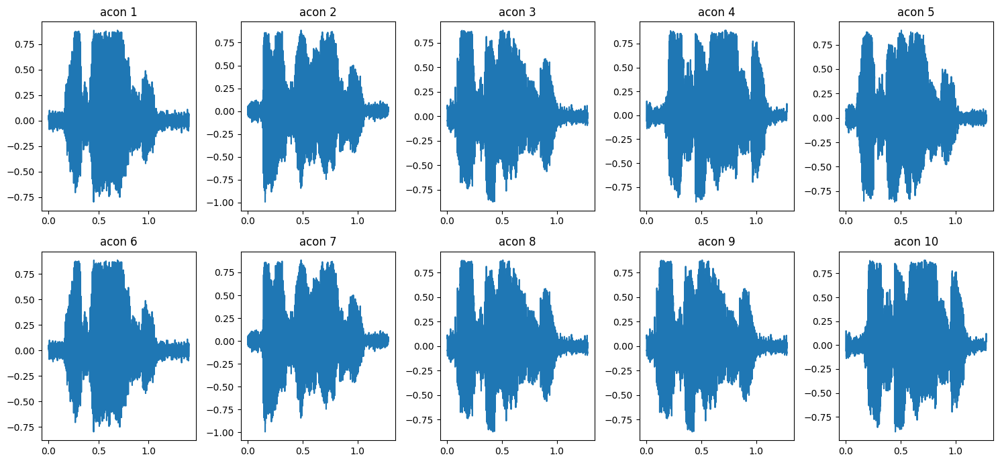

In [ ]:
import matplotlib.pyplot as plt
import librosa
import numpy as np

# List of 10 audio files (replace with your file paths)
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_2.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_3.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_4.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_5.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_6.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_7.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_8.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_9.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'acon {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("acon.jpg")
plt.show()



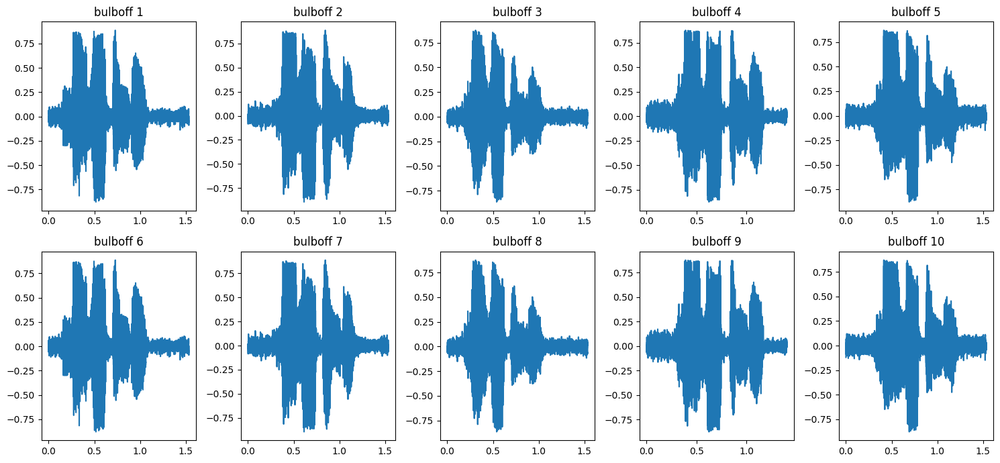

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_2.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_3.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_4.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_5.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_6.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_7.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_8.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_9.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'bulboff {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("bulboff.jpg")
plt.show()


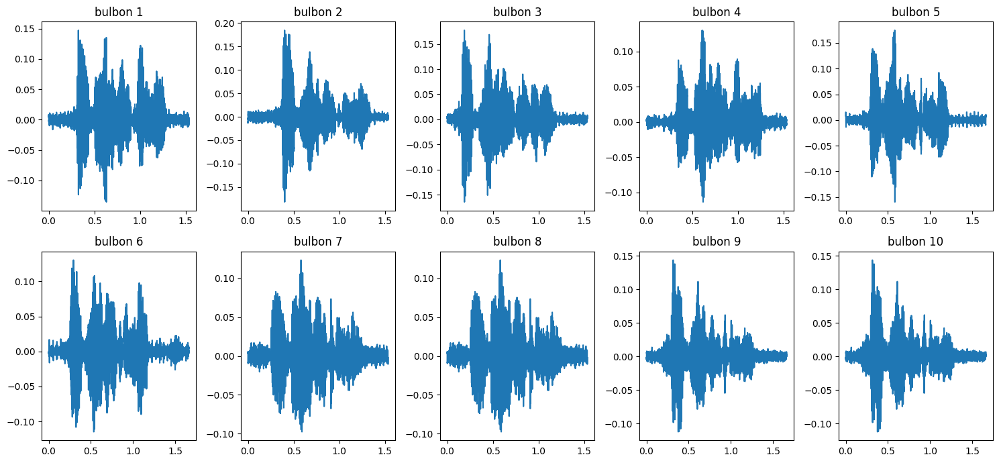

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_2.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_3.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_4.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_5.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_6.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_7.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_8.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_9.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'bulbon {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("bulbon.jpg")
plt.show()


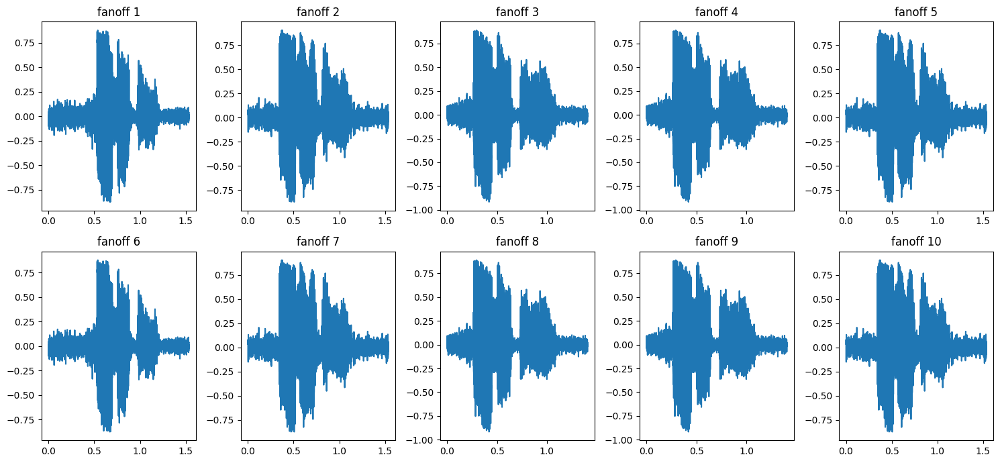

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_2.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_3.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_4.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_5.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_6.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_7.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_8.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_9.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'fanoff {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("fanoff.jpg")
plt.show()


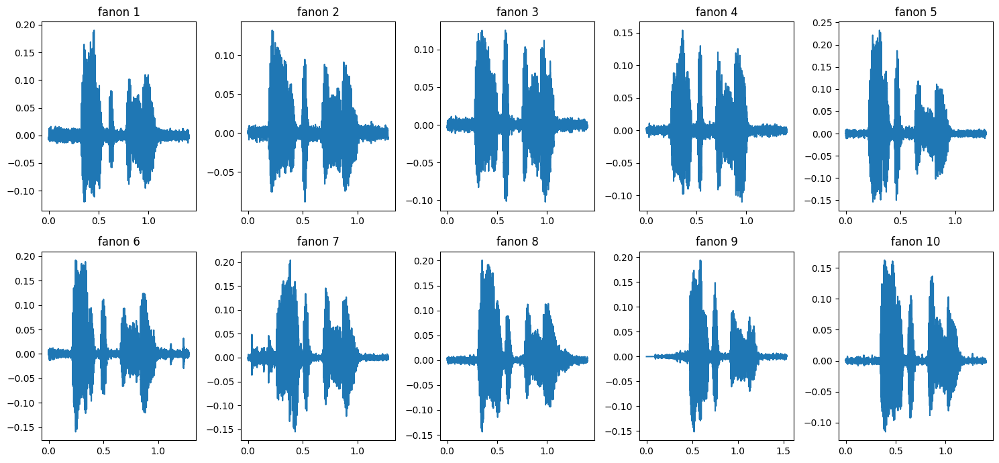

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_2.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_3.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_4.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_5.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_6.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_7.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_8.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_9.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'fanon {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("fanon.jpg")
plt.show()


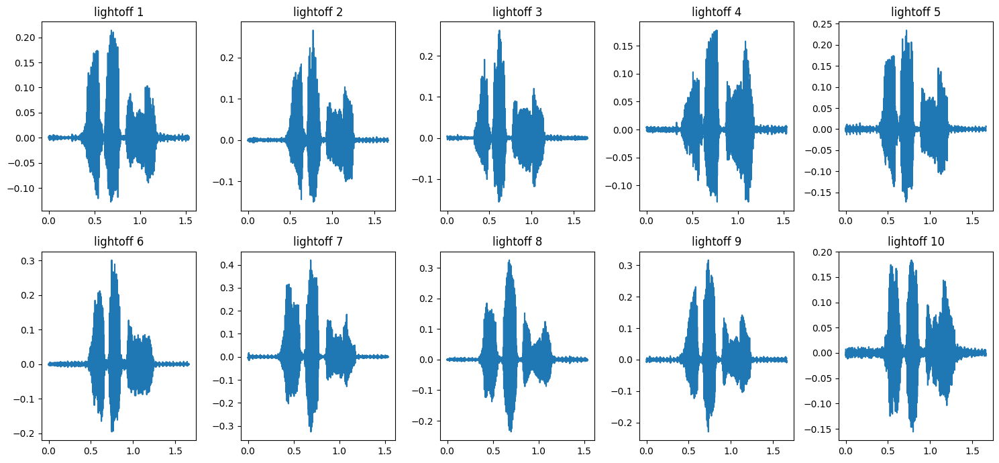

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_2.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_3.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_4.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_5.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_6.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_7.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_8.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_9.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_10.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'lightoff {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("lightoff.jpg")
plt.show()


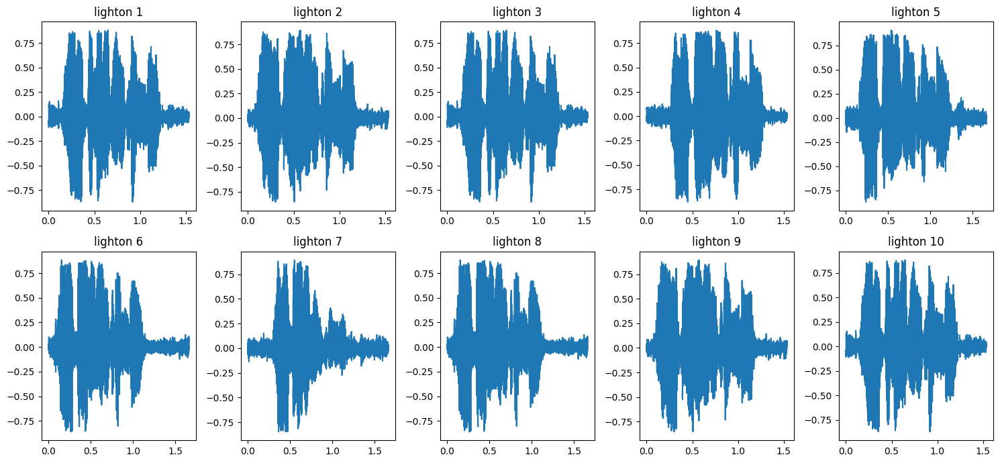

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_1.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_10.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_11.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_12.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_13.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_14.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_15.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_16.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_17.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_18.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'lighton {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("lighton.jpg")
plt.show()


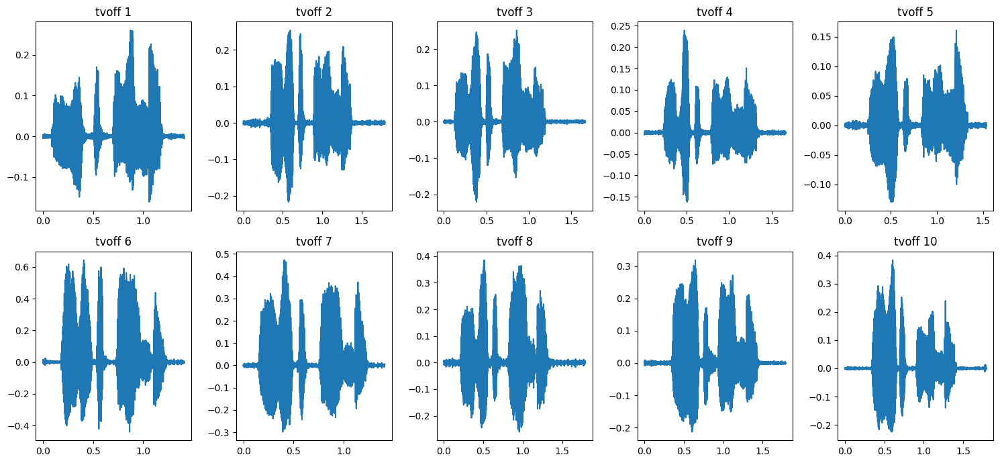

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_10.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_11.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_12.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_13.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_14.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_15.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_16.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_17.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_18.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'tvoff {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("tvoff.jpg")
plt.show()


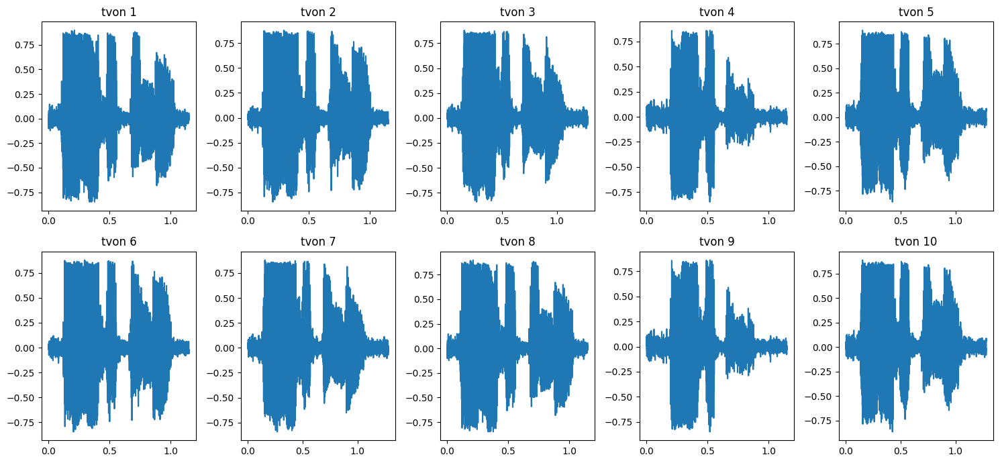

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_10.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_11.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_12.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_13.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_14.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_15.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_16.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_17.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            audio, sr = librosa.load(audio_file, sr=None)

            # Plot the waveform
            ax.plot(np.arange(len(audio)) / sr, audio)
            ax.set_title(f'tvon {i * 5 + j + 1}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("tvon.jpg")
plt.show()


In [ ]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

# Load audio file
audio_path = '/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav'
y, sr = librosa.load(audio_path, sr=None)

# Extract MFCCs
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

# Select an MFCC coefficient to plot
mfcc_number = 0  # Change this to select a different MFCC coefficient (0 to 12)

# Plotting a single MFCC curve vs. frame number
plt.figure(figsize=(10, 6))

num_frames = mfccs.shape[1]  # Get the number of frames
frame_numbers = np.arange(0, num_frames)

plt.plot(frame_numbers, mfccs[mfcc_number], label=f'MFCC {mfcc_number+1}', linewidth=2)

plt.xlabel('Frame Number')
plt.ylabel('MFCC Value')
plt.title(f'MFCC {mfcc_number+1} vs Frame Number')
plt.legend()

plt.show()


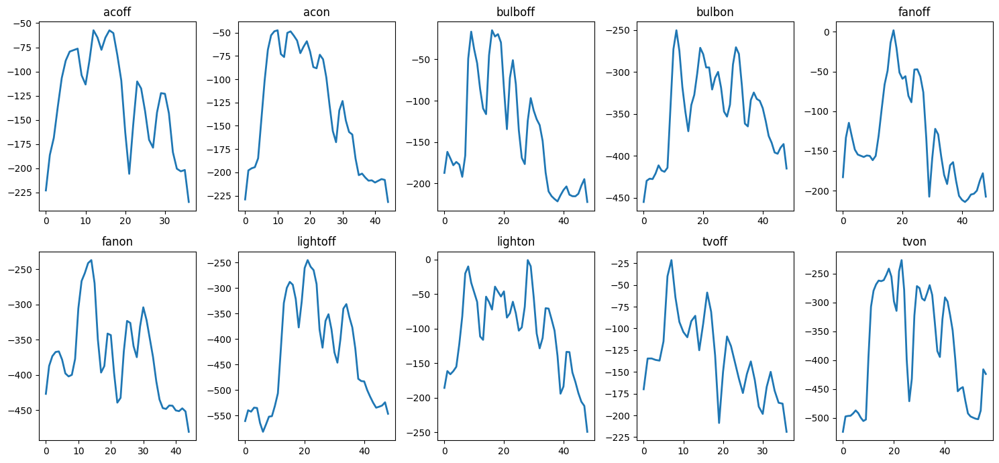

In [ ]:
audio_files = [
   "/content/drive/MyDrive/H7TELUGU/acoff/H7_acoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/acon/H7_acon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/bulboff/H7_bulboff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/bulbon/H7_bulbon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/fanoff/H7_fanoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/fanon/H7_fanon_1.wav",
    "/content/drive/MyDrive/H7TELUGU/lightoff/H7_lightoff_1.wav",
    "/content/drive/MyDrive/H7TELUGU/lighton/H7_lighton_1.wav",
    "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_17.wav",
    "/content/drive/MyDrive/H7TELUGU/tvoff/H7_tvoff_18.wav",
]

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 7))

for i in range(2):
    for j in range(5):
        if len(audio_files) > i * 5 + j:
            ax = axes[i, j]
            audio_file = audio_files[i * 5 + j]

            # Load the audio file and extract the waveform
            y, sr = librosa.load(audio_file, sr=None)
            mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
            mfcc_number = 0
            num_frames = mfccs.shape[1]  # Get the number of frames
            frame_numbers = np.arange(0, num_frames)
            ax.plot(frame_numbers, mfccs[mfcc_number], label=f'MFCC {mfcc_number+1}', linewidth=2)
            keyword=mapping[i * 5 + j]
            ax.set_title(f'{keyword}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.savefig("mfcc.jpg")
plt.show()


In [ ]:
mapping = [
        "acoff",
        "acon",
        "bulboff",
        "bulbon",
        "fanoff",
        "fanon",
        "lightoff",
        "lighton",
        "tvoff",
        "tvon"]
print(mapping[0])

acoff


**MFCCS**

In [ ]:
import librosa

audio_path = "/content/drive/MyDrive/H7TELUGU/tvon/H7_tvon_18.wav"
y, sr = librosa.load(audio_path)


In [ ]:
import librosa.display

mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)  # You can adjust n_mfcc according to your preference


In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the audio file

audio_data, sample_rate = librosa.load(audio_path)

# Create a spectrogram
spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate, n_fft=2048, hop_length=512)
spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)  # Convert to dB scale for better visualization


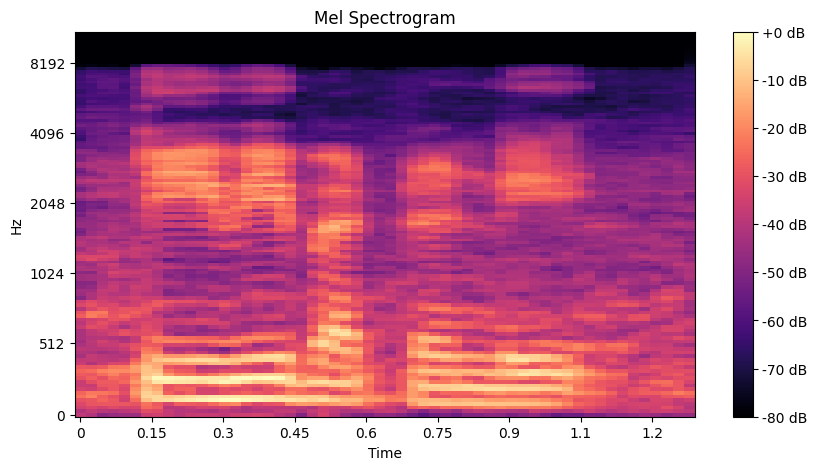

In [ ]:
# Display the spectrogram
plt.figure(figsize=(10, 5))
librosa.display.specshow(spectrogram_db, sr=sample_rate, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel Spectrogram')
plt.show()


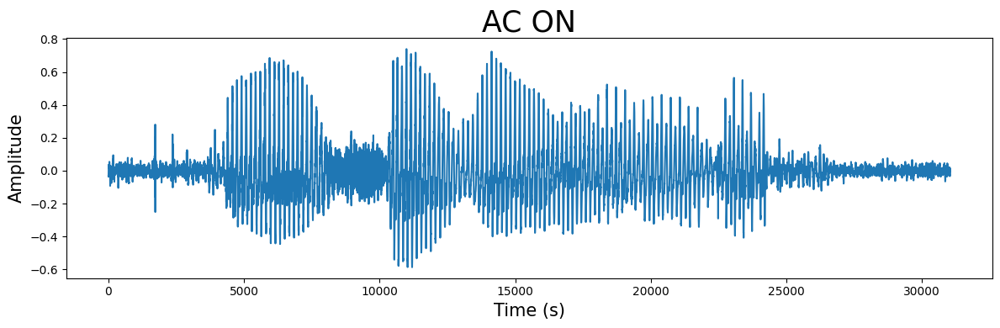

In [ ]:
import matplotlib.pyplot as plt
import librosa

# Load an audio file
audio_path = '/content/drive/MyDrive/Test/acon/j3_acon_2.wav'
audio, sr = librosa.load(audio_path)

# Plot the waveform
plt.figure(figsize=(12, 4))
plt.plot(audio)
plt.xlabel('Time (s)',fontsize=15)
plt.ylabel('Amplitude',fontsize=15)
plt.title('AC ON',fontsize=25)
plt.xticks(fontsize=10)  # Adjust x-axis tick font size
plt.yticks(fontsize=10)  # Adjust y-axis tick font size
plt.tight_layout()
plt.savefig("ac_on_wave.jpg")
plt.show()


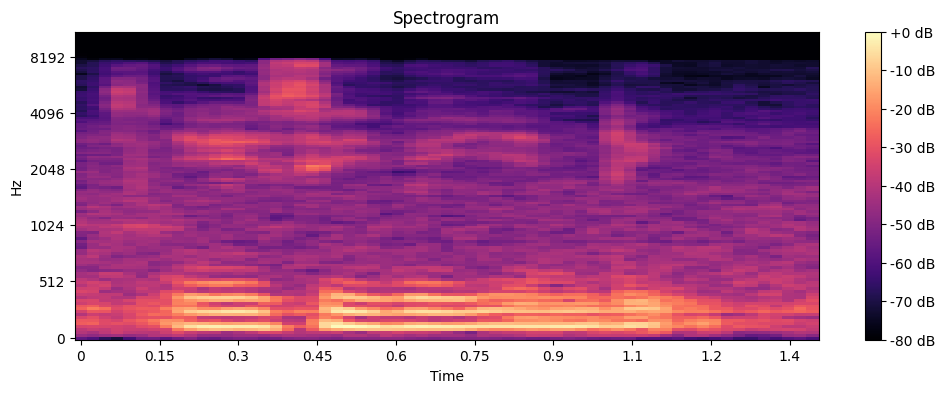

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Load an audio file
audio, sr = librosa.load(audio_path)

# Compute the spectrogram
spectrogram = librosa.feature.melspectrogram(y=audio, sr=sr)

# Plot the spectrogram
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max), y_axis='mel', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()


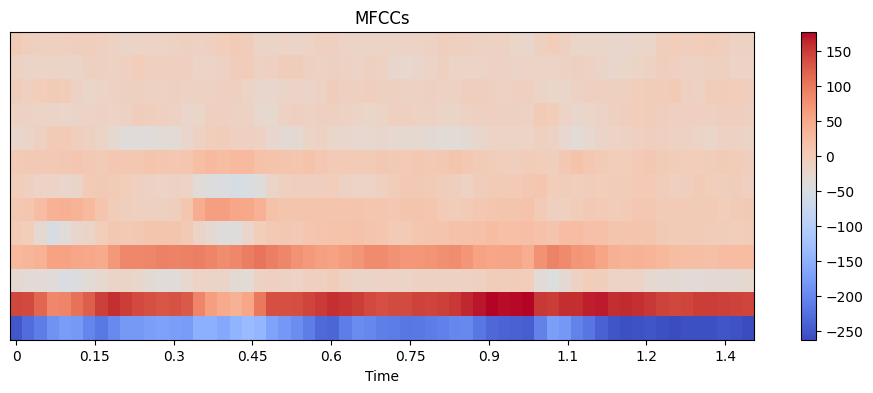

In [ ]:
import matplotlib.pyplot as plt
import librosa.display

# Load an audio file
audio, sr = librosa.load(audio_path)

# Compute MFCCs
mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)

# Plot MFCCs
plt.figure(figsize=(12, 4))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCCs')
plt.show()


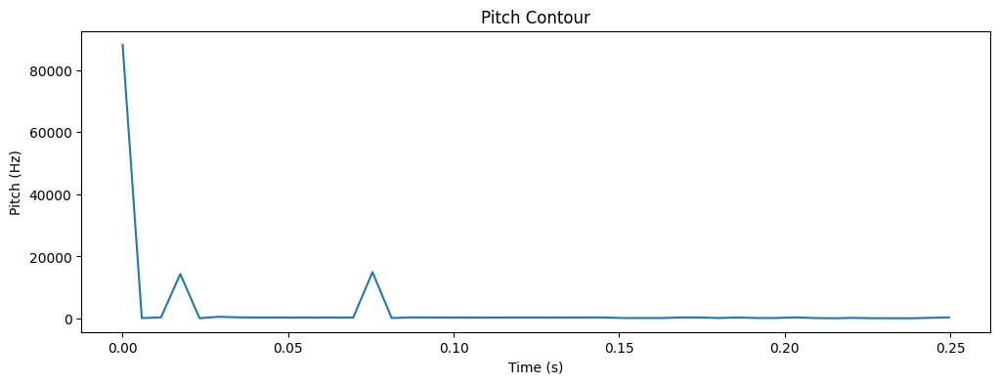

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import aubio

# Load an audio file

# Create aubio pitch object
pitch_detection = aubio.pitch("yin")

# Open the audio file
audio_file = aubio.source(audio_path, 0, 512)

# Initialize an empty list to store pitch values
pitch_values = []

# Process the audio file to compute pitch
while True:
    samples, read = audio_file()
    if read:
        pitch = pitch_detection(samples)[0]
        pitch_values.append(pitch)
    else:
        break

# Plot the pitch contour
time = np.arange(0, len(pitch_values)) * 256 / 44100  # Adjust for your audio's sample rate
plt.figure(figsize=(12, 4))
plt.plot(time, pitch_values)
plt.xlabel('Time (s)')
plt.ylabel('Pitch (Hz)')
plt.title('Pitch Contour')
plt.show()



In [ ]:
pip install pypitch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.6/608.6 kB 9.7 MB/s eta 0:00:00


In [ ]:
pip show pypitch

Name: pypitch
Version: 2.0
Summary: PyPitch analyses audio streams for pitch
Home-page: https://fofix.org
Author: FoFiX team
Author-email: contact@fofix.org
License: GPLv2+
Location: /usr/local/lib/python3.10/dist-packages
Requires: Cython
Required-by: 


In [ ]:
pip install aubio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.0/479.0 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for aubio: filename=aubio-0.4.9-cp310-cp310-linux_x86_64.whl size=425174 sha256=072a8fbef81058b382e38e0cfb610d2cc295a14658432da327fb9e88f7f5b68a
  Stored in directory: /root/.cache/pip/wheels/00/30/30/a06fe7e9c7fe740486c219851b2bc1c7ed4a97e9c257efd3d7
Successfully built aubio


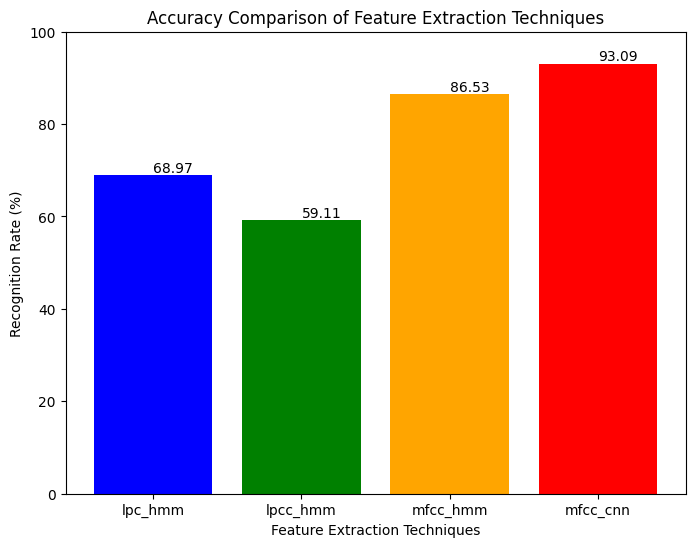

In [ ]:
import matplotlib.pyplot as plt

# Data
labels = ['lpc_hmm', 'lpcc_hmm', 'mfcc_hmm', 'mfcc_cnn']
accuracy_rates = [68.97, 59.112, 86.5273, 93.09]

# Plotting the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(labels, accuracy_rates, color=['blue', 'green', 'orange', 'red'])
plt.xlabel('Feature Extraction Techniques')
plt.ylabel('Recognition Rate (%)')
plt.title('Accuracy Comparison of Feature Extraction Techniques')
plt.ylim(0, 100)

# Adding percentages on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom')

plt.savefig('accuracy.jpg')
plt.show()



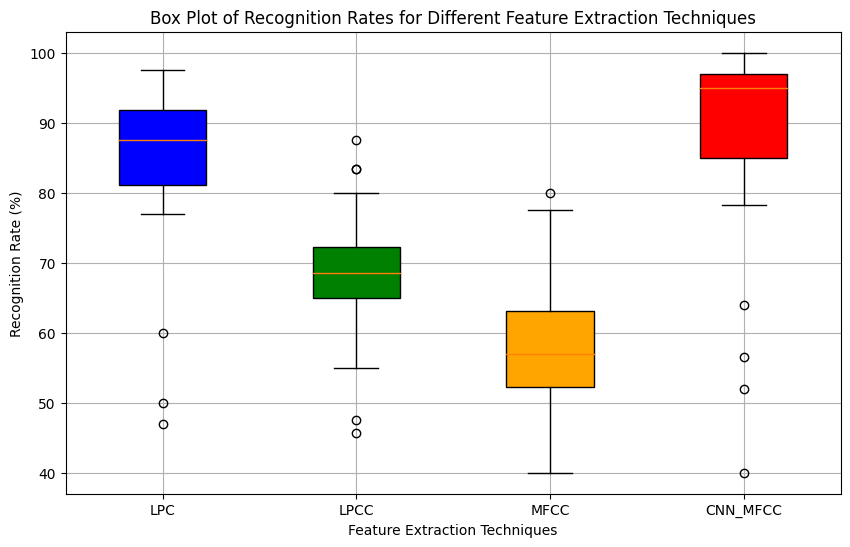

In [ ]:
import matplotlib.pyplot as plt

# Data
lpc_data = [90, 77.77, 97.22, 90, 87.5, 92.5, 91.666, 92.5, 93, 91.666, 60, 92.5, 97.5, 90, 85, 87, 95, 93, 77, 97.5, 78, 89, 93, 95, 89, 81.08, 77.77, 87.5, 50, 91.68, 85, 77.77, 87, 87, 81, 85, 86, 81.08, 92.5, 81.084, 90, 87, 87, 89.5, 81, 90, 47, 81]
lpcc_data = [65, 72.22, 69.44, 67.5, 62.5, 65, 83.33, 87.5, 64.1025, 70.833, 45.714, 75, 55, 65, 80, 67.5, 70, 72.5, 72.22, 57.5, 80, 63.63, 72.5, 70, 47.5, 60, 72.2, 62.5, 67.5, 83.33, 80, 72.22, 67.5, 67.5, 70.2, 80, 70.8, 75, 60, 70, 65, 67.3, 71.77, 70.8, 67.3, 65, 67.5, 67.3]
mfcc_data = [45, 50, 55.55, 50, 50, 62.5, 72.22, 80, 69.23, 58.33, 51.42, 72.5, 40, 65, 77.5, 57.5, 57.5, 57.5, 55, 60, 77.5, 52.27, 55, 60, 45, 56.756, 50, 52, 52, 72.2, 77.54, 50.4, 57, 57, 56.7, 77, 58.334, 72, 55, 56, 65, 56.2, 47, 58.3, 56, 60, 57.5, 56]
cnn_mfcc_data = [91, 94, 96.66, 97, 40, 91, 64, 95.09, 97, 98, 98, 96, 98, 56.49, 96.66666667, 80, 80, 84.67741935, 97, 85, 95, 99.5, 99.5, 96, 100, 97, 95, 91.5, 95, 88.88, 52, 100, 100, 93, 78.3, 78.3, 94, 100, 100, 84.6, 88.8]

# Combine all data
data = [lpc_data, lpcc_data, mfcc_data, cnn_mfcc_data]
labels = ['LPC', 'LPCC', 'MFCC', 'CNN_MFCC']
colors = ['blue', 'green', 'orange', 'red']

# Plotting the box plot with colors
plt.figure(figsize=(10, 6))
box = plt.boxplot(data, patch_artist=True, labels=labels)

# Set colors for each box
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

plt.xlabel('Feature Extraction Techniques')
plt.ylabel('Recognition Rate (%)')
plt.title('Box Plot of Recognition Rates for Different Feature Extraction Techniques')
plt.grid(True)
plt.show()




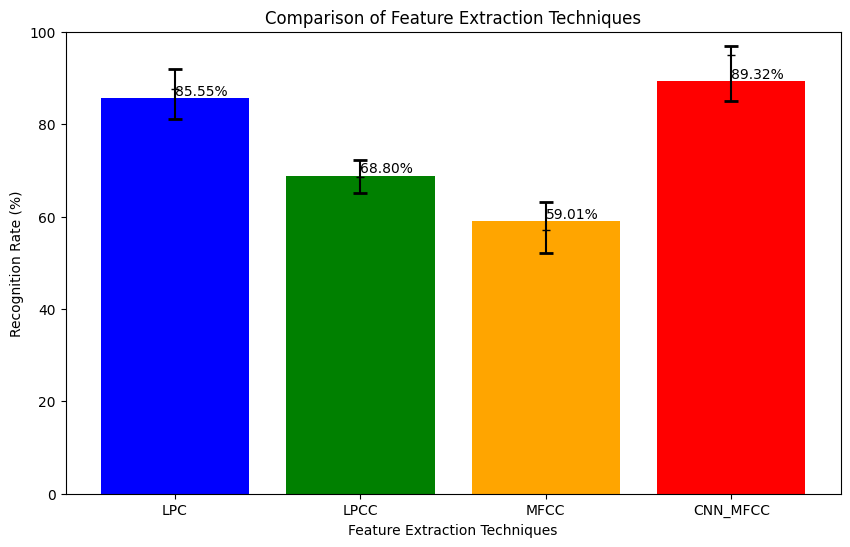

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
features = ['LPC', 'LPCC', 'MFCC', 'CNN_MFCC']
bar_heights = [np.mean(lpc_data), np.mean(lpcc_data), np.mean(mfcc_data), np.mean(cnn_mfcc_data)]
box_data = [lpc_data, lpcc_data, mfcc_data, cnn_mfcc_data]

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(features, bar_heights, color=['blue', 'green', 'orange', 'red'])

# Overlay box plots on the bar plot
for i, data in enumerate(box_data):
    median = np.median(data)
    quartiles = np.percentile(data, [25, 75])
    plt.errorbar(i, median, yerr=[[median - quartiles[0]], [quartiles[1] - median]], fmt='_', color='black', capsize=5, capthick=2)

# Add percentages on top of each bar
for bar, height in zip(bars, bar_heights):
    plt.text(bar.get_x() + bar.get_width()/2, height, f'{height:.2f}%', ha='left', va='bottom')

plt.xlabel('Feature Extraction Techniques')
plt.ylabel('Recognition Rate (%)')
plt.title('Comparison of Feature Extraction Techniques')
plt.ylim(0, 100)
plt.savefig('accuracy.jpg')
plt.show()


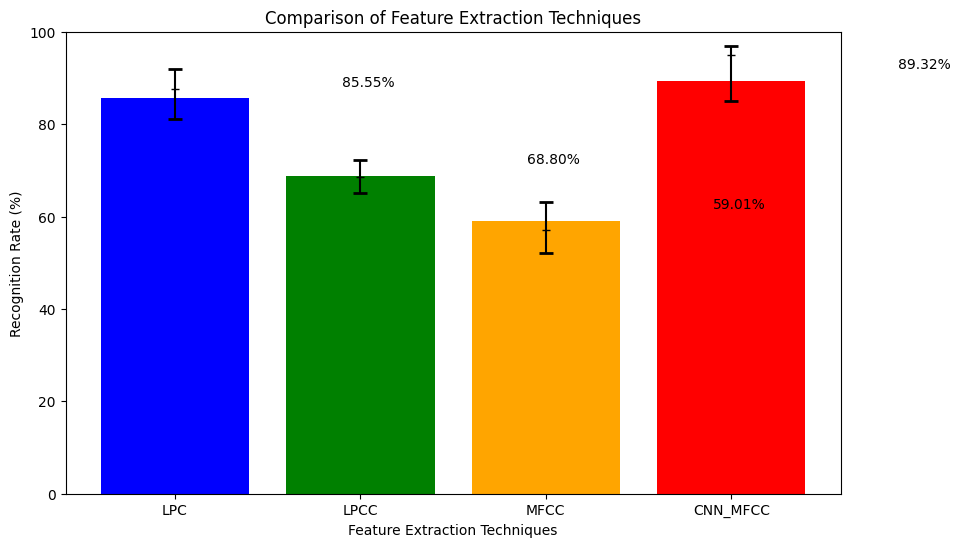

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
features = ['LPC', 'LPCC', 'MFCC', 'CNN_MFCC']
bar_heights = [np.mean(lpc_data), np.mean(lpcc_data), np.mean(mfcc_data), np.mean(cnn_mfcc_data)]
box_data = [lpc_data, lpcc_data, mfcc_data, cnn_mfcc_data]

# Create bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(features, bar_heights, color=['blue', 'green', 'orange', 'red'])

# Overlay box plots on the bar plot
for i, data in enumerate(box_data):
    median = np.median(data)
    quartiles = np.percentile(data, [25, 75])
    plt.errorbar(i, median, yerr=[[median - quartiles[0]], [quartiles[1] - median]], fmt='_', color='black', capsize=5, capthick=2)

# Add percentages on top of each bar
for i, (bar, height) in enumerate(zip(bars, bar_heights)):
    plt.text(i + 0.9, height + 2, f'{height:.2f}%', ha='left', va='bottom')

plt.xlabel('Feature Extraction Techniques')
plt.ylabel('Recognition Rate (%)')
plt.title('Comparison of Feature Extraction Techniques')
plt.ylim(0, 100)

plt.show()


In [ ]:
from cnn_block_visualizer import CNNBlockVisualizer  # Assuming the class is saved in a file named cnn_block_visualizer.py

# Define layer information based on the summary
layer_info = [
    ("conv2d_3", "Conv2D", (None, 30, 11, 64)),
    ("batch_normalization_3", "BatchNormalization", (None, 30, 11, 64)),
    ("max_pooling2d_3", "MaxPooling2D", (None, 15, 6, 64)),
    ("conv2d_4", "Conv2D", (None, 13, 4, 32)),
    ("batch_normalization_4", "BatchNormalization", (None, 13, 4, 32)),
    ("max_pooling2d_4", "MaxPooling2D", (None, 7, 2, 32)),
    ("conv2d_5", "Conv2D", (None, 6, 1, 32)),
    ("batch_normalization_5", "BatchNormalization", (None, 6, 1, 32)),
    ("max_pooling2d_5", "MaxPooling2D", (None, 3, 1, 32)),
    ("flatten_1", "Flatten", (None, 96)),
    ("dense_2", "Dense", (None, 64)),
    ("dropout_1", "Dropout", (None, 64)),
    ("dense_3", "Dense", (None, 455)),
]

# Create the visualizer
visualizer = CNNBlockVisualizer("Pre-trained Model", (None, 32, 32, 3), (None, 455))

# Add layers and connections based on the information
for name, layer_type, output_shape in layer_info:
    visualizer.add_layer(name, layer_type)

# Connect convolutional layers to subsequent layers (assuming standard connections)
prev_layer = None
for name, _, _ in layer_info:
    if name.startswith("conv2d"):
        if prev_layer:
            visualizer.connect_layers(prev_layer, name)
        prev_layer = name

# Connect remaining layers sequentially
for i in range(1, len(layer_info)):
    visualizer.connect_layers(layer_info[i-1][0], layer_info[i][0])

# Generate the image
visualizer.generate_image("pre_trained_model.png")


ModuleNotFoundError: No module named 'cnn_block_visualizer'